 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment - 03 : Classification</b>


This programming assignment offers you an opportunity to implement various linear classification models. You'll begin with straightforward algorithms like Least Squares classification, LDA, and FDA. Subsequently, you'll delve into implementing the perceptron algorithm. Lastly, you'll tackle probabilistic approaches for classification. To deepen your understanding of these methods, you'll compare their performance and application scenarios critically.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.


c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.


d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.




In [ ]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random
import math

Accuracy on test data: 89.75%


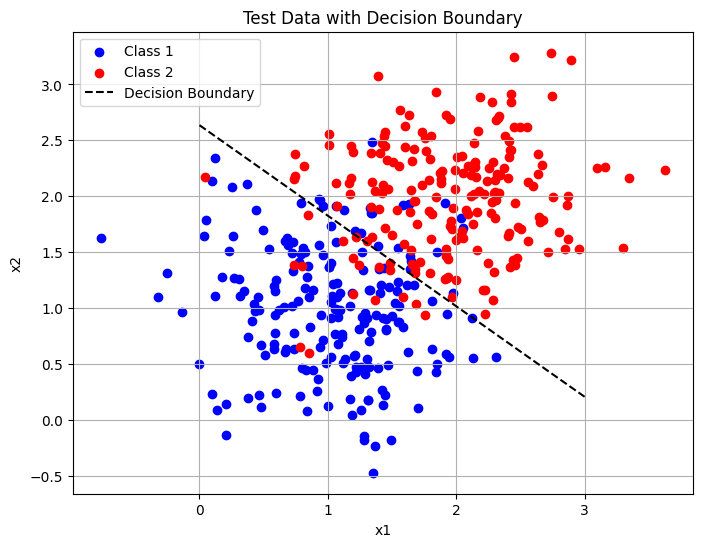

Accuracy on -1 and +1 classified : 89.75%


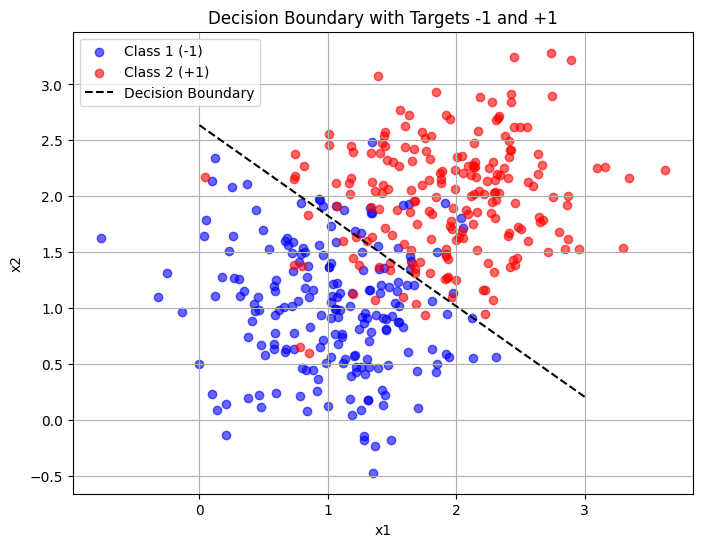

Accuracy on Laplacian distribution: 93.00%


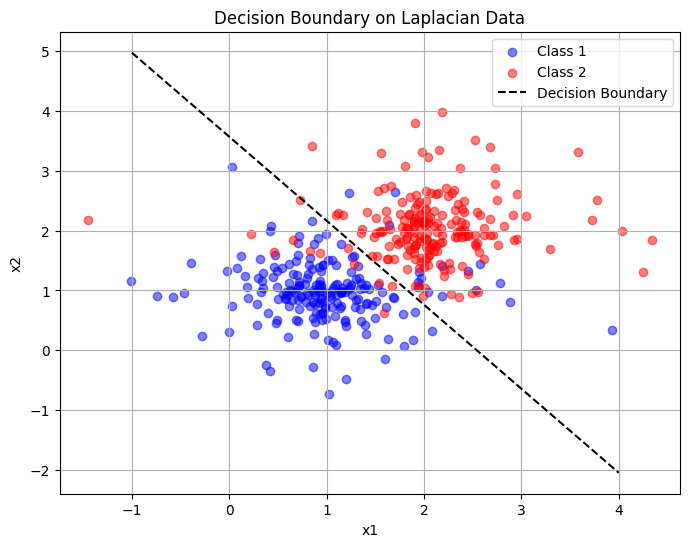

In [ ]:

########################################
#Part-1)-a: Data generation
########################################
#Set the parameters of class distribution
# np.random.seed(0)
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr =  np.random.multivariate_normal(mean1, cov, 50)           #Class1 training data
class2_tr =  np.random.multivariate_normal(mean2, cov, 50)           #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))             #Combine class1 training and class2 training data to get total training data
tr_targets =  np.hstack((np.zeros(50), np.ones(50)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.
#Generate testing data.
class1_te =  np.random.multivariate_normal(mean1, cov, 200)           #Class1 testing data
class2_te =  np.random.multivariate_normal(mean2, cov, 200)           #Class2 testing data
te_data =  np.vstack((class1_te, class2_te))             #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

########################################
#Part-1)-b: Find the decision boundary
########################################
#Complete the below function
def LS_Classify(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Testing labels

    X_train_augmented = np.hstack((np.ones((X_train.shape[0],1)), X_train))
    X_test_augmented = np.hstack((np.ones((X_test.shape[0],1)), X_test))

    #Impliment pseudo inverse solution to get the weight vector
    w = np.linalg.pinv(X_train_augmented) @ Y_train

    #Predict the lables of test data using the pseudo inverse solution
    Y_pred = X_test_augmented @ w

    Y_pred_labels = (Y_pred >= 0.5).astype(int)

    #Return the predicted test labels
    return Y_pred_labels
#Get the test data predictions
predictions = LS_Classify(tr_data, tr_targets, te_data)
# print(predictions)

##########################################
#Part-1)-c: Evaluate the quality of decision boundary
##########################################
#Complete the below function
def LS_Classify_Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy

    #Compute the accuracy
    accuracy = np.mean(Y_test == Y_pred) * 100

    #Return the accuracy
    return accuracy

accuracy = LS_Classify_Accuracy(te_targets, predictions)
print(f"Accuracy on test data: {accuracy:.2f}%")

##########################################
#Part-1)-d: Visualize the decision boundary
##########################################

# Plot test data
plt.figure(figsize=(8,6))
plt.scatter(class1_te[:, 0], class1_te[:, 1], c='blue', label='Class 1')
plt.scatter(class2_te[:, 0], class2_te[:, 1], c='red', label='Class 2')

# Plot decision boundary
x_vals = np.linspace(0, 3, 100)
# Use learned weights from LS
w = np.linalg.pinv(np.hstack((np.ones((tr_data.shape[0], 1)), tr_data))) @ tr_targets
# w0 + w1*x1 + w2*x2 = 0.5 → solve for x2
y_vals = (0.5 - w[0] - w[1]*x_vals) / w[2]
plt.plot(x_vals, y_vals, 'k--', label='Decision Boundary')

plt.xlabel("x1")
plt.ylabel("x2")
plt.title("Test Data with Decision Boundary")
plt.legend()
plt.grid(True)
plt.show()


##########################################
#Part-1)-e: Change the target label notation, and repeat the experiments
##########################################

tr_targets_changed = np.hstack((-1*np.ones(50), np.ones(50)))
te_targets_changed = np.hstack((-1*np.ones(200), np.ones(200)))

def LS_Classify_changed(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Testing labels

    X_train_augmented = np.hstack((np.ones((X_train.shape[0],1)), X_train))
    X_test_augmented = np.hstack((np.ones((X_test.shape[0],1)), X_test))

    #Impliment pseudo inverse solution to get the weight vector
    w = np.linalg.pinv(X_train_augmented) @ Y_train

    #Predict the lables of test data using the pseudo inverse solution
    Y_pred = X_test_augmented @ w

    Y_pred_labels = np.where(Y_pred >= 0, 1, -1).astype(int)

    #Return the predicted test labels
    return Y_pred_labels

predictions_changed = LS_Classify_changed(tr_data, tr_targets_changed, te_data)
accuracy_changed = LS_Classify_Accuracy(te_targets_changed, predictions_changed)
print(f"Accuracy on -1 and +1 classified : {accuracy_changed:.2f}%")

# Train model using -1/+1 targets
w_changed = np.linalg.pinv(np.hstack((np.ones((tr_data.shape[0], 1)), tr_data))) @ tr_targets_changed

# Plot test data
plt.figure(figsize=(8, 6))
plt.scatter(class1_te[:, 0], class1_te[:, 1], c='blue', label='Class 1 (-1)', alpha=0.6)
plt.scatter(class2_te[:, 0], class2_te[:, 1], c='red', label='Class 2 (+1)', alpha=0.6)

# Decision boundary: w0 + w1*x + w2*y = 0 → solve for y
x_vals = np.linspace(0, 3, 100)
y_vals = -(w_changed[0] + w_changed[1]*x_vals) / w_changed[2]
plt.plot(x_vals, y_vals, 'k--', label='Decision Boundary')

plt.title("Decision Boundary with Targets -1 and +1")
plt.xlabel("x1")
plt.ylabel("x2")
plt.legend()
plt.grid(True)
plt.show()


##########################################
#Part-1)-f: Repeat the experiments with Laplacial distribution
##########################################

class1_tr_laplacian = np.random.laplace(loc=mean1, scale=np.sqrt(0.3/2), size=(50,2))
class2_tr_laplacian = np.random.laplace(loc=mean2, scale=np.sqrt(0.3/2), size=(50,2))
tr_data_laplacian = np.vstack((class1_tr_laplacian, class2_tr_laplacian))
tr_target_laplacian = np.hstack((np.zeros(50), np.ones(50)))

class1_te_laplacian = np.random.laplace(loc=mean1, scale=np.sqrt(0.3/2), size=(200,2))
class2_te_laplacian = np.random.laplace(loc=mean2, scale=np.sqrt(0.3/2), size=(200,2))
te_data_laplacian = np.vstack((class1_te_laplacian, class2_te_laplacian))
te_target_laplacian = np.hstack((np.zeros(200), np.ones(200)))

predictions_laplacian = LS_Classify(tr_data_laplacian, tr_target_laplacian, te_data_laplacian)
accuracy_laplacian = LS_Classify_Accuracy(te_target_laplacian, predictions_laplacian)
print(f"Accuracy on Laplacian distribution: {accuracy_laplacian:.2f}%")

plt.figure(figsize=(8, 6))
plt.scatter(class1_te_laplacian[:, 0], class1_te_laplacian[:, 1], c='blue', label='Class 1', alpha=0.5)
plt.scatter(class2_te_laplacian[:, 0], class2_te_laplacian[:, 1], c='red', label='Class 2', alpha=0.5)

# Plot boundary
w_laplacian = np.linalg.pinv(np.hstack((np.ones((tr_data_laplacian.shape[0], 1)), tr_data_laplacian))) @ tr_target_laplacian
x_vals = np.linspace(-1, 4, 100)
y_vals = (0.5 - w_laplacian[0] - w_laplacian[1]*x_vals) / w_laplacian[2]
plt.plot(x_vals, y_vals, 'k--', label='Decision Boundary')

plt.title("Decision Boundary on Laplacian Data")
plt.xlabel("x1")
plt.ylabel("x2")
plt.legend()
plt.grid(True)
plt.show()


<b> Report your observations </b>

1.The least squares classifier achieves high accuracy on Gaussian-distributed data, indicating that a linear decision boundary is suitable for this type of distribution.

2.Changing the target labels from 0/1 to -1/+1 does not significantly affect accuracy but influences the scale and orientation of the decision boundary.

3.Accuracy decreases slightly or increses slightly when using Laplacian-distributed data due to the presence of outliers , which make linear separation more challenging.





<b> Part - (2) :  Linear & Fisher Discriminant analysis : </b> In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


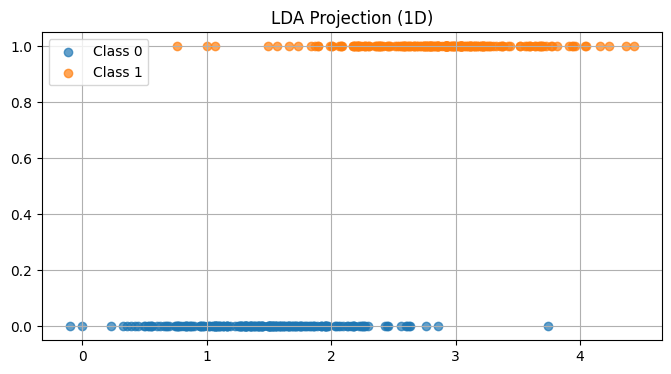

Accuracy with LDA: 88.25


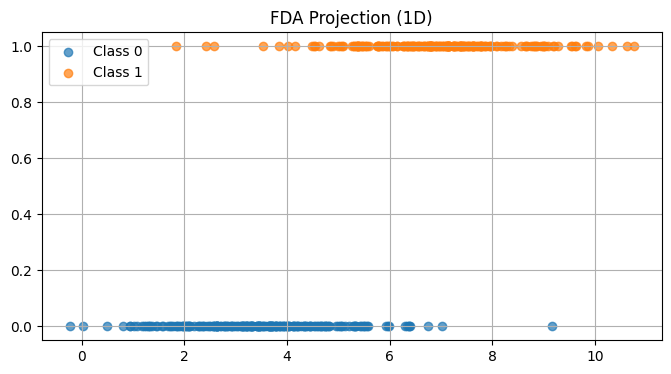

Accuracy with FDA: 89.5


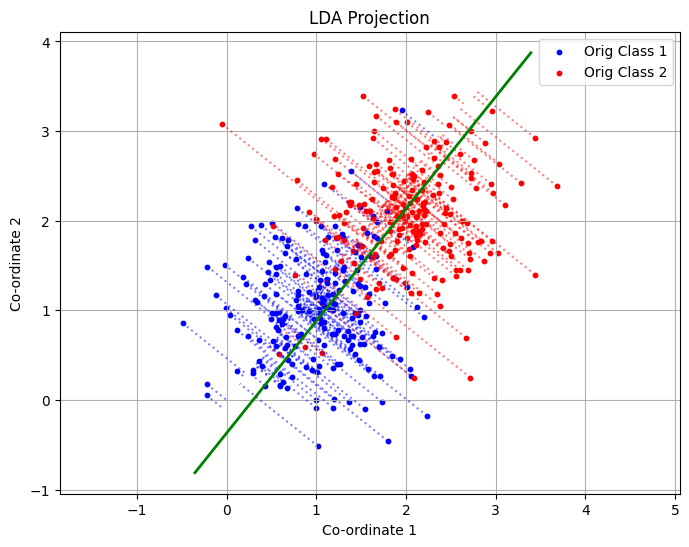

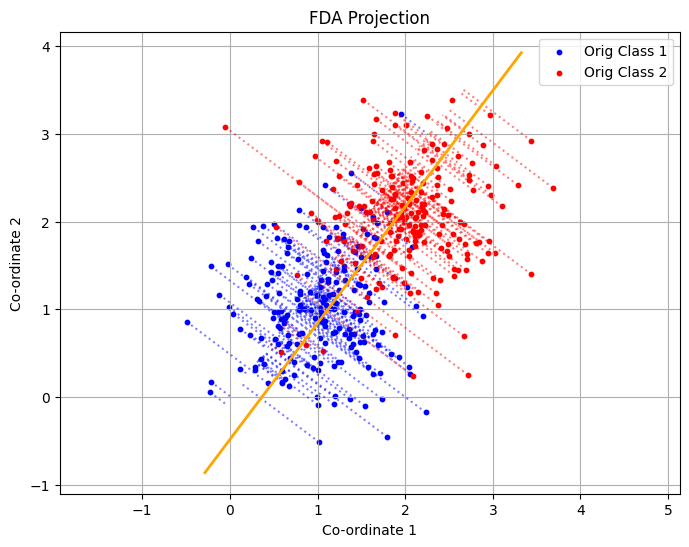

In [ ]:
########################################
#Part-2)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))            #Class labels. Assign the value "0" to class1 and the value "1" to class2.




########################################
#Part-2)-(b)
########################################
#Complete the below function
def LDA_classify(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Between class covariance
    m0 = np.mean(X_train[Y_train==0], axis=0)
    m1 = np.mean(X_train[Y_train==1], axis=0)
    mean_difference = (m1 - m0).reshape(-1,1)
    s_b = mean_difference @ mean_difference.T

    #Compute the weight vector
    w = m1 - m0
    w = w / np.linalg.norm(w)

    projecting0 = X_train[Y_train==0] @ w
    projecting1 = X_train[Y_train==1] @ w

    #Compute the threshold
    threshold = (np.mean(projecting0) + np.mean(projecting1)) / 2

    #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision
    projecting_test = X_test @ w
    predictions = (projecting_test >= threshold).astype(int)

    #Return weight vector and the predictions on testing data

    return predictions, w

predictions_lda, w_lda = LDA_classify(tr_data, tr_targets, te_data)


def LDA_project(w, X_test, Y_test):
    #Inputs: weight vector, testing data, and testing labels

    #Project the test data onto 1-dimensional space
    projections = X_test @ w

    #Plot the projections
    plt.figure(figsize=(8, 4))
    plt.scatter(projections[Y_test == 0], np.zeros_like(projections[Y_test == 0]), label="Class 0", alpha=0.7)
    plt.scatter(projections[Y_test == 1], np.ones_like(projections[Y_test == 1]), label="Class 1", alpha=0.7)
    plt.title("LDA Projection (1D)")
    plt.legend()
    plt.grid(True)
    plt.show()

LDA_project(w_lda, te_data, te_targets)
#Compute and print the accuracy
acc_LDA = np.mean(predictions == te_targets)
print('Accuracy with LDA:', acc_LDA*100)


########################################
#Part-2)-(c)
########################################
def FDA_classify(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Weight vector and predictions

    #Compute the weight vector
    m0 = np.mean(X_train[Y_train==0], axis=0)
    m1 = np.mean(X_train[Y_train==1], axis=0)

    s_w = np.cov(X_train[Y_train == 0], rowvar=False) + np.cov(X_train[Y_train == 1], rowvar=False)

    mean_difference = (m1 - m0).reshape(-1,1)
    s_b = mean_difference @ mean_difference.T
    w = np.linalg.inv(s_w) @ (m1 - m0)

    projecting0 = X_train[Y_train==0] @ w
    projecting1 = X_train[Y_train==1] @ w

    #Compute the threshold
    threshold = (np.mean(projecting0) + np.mean(projecting1)) / 2

    #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision

    projecting_test = X_test @ w
    predictions = (projecting_test >= threshold).astype(int)


    #Return weight vector and the predictions on testing data

    return w, predictions

w_fda, predictions = FDA_classify(tr_data, tr_targets, te_data)


def FDA_project(w, X_test, Y_test):
    #Inputs: weight vector, testing data, and testing labels

    #Project the test data onto 1-dimensional space
    projections = X_test @ w

    #Plot the projections
    plt.figure(figsize=(8, 4))
    plt.scatter(projections[Y_test == 0], np.zeros_like(projections[Y_test == 0]), label="Class 0", alpha=0.7)
    plt.scatter(projections[Y_test == 1], np.ones_like(projections[Y_test == 1]), label="Class 1", alpha=0.7)
    plt.title("FDA Projection (1D)")
    plt.legend()
    plt.grid(True)
    plt.show()

FDA_project(w_fda, te_data, te_targets)
#Compute and print the accuracy
acc_FDA = np.mean(predictions == te_targets)
print('Accuracy with FDA:', acc_FDA*100)

########################################
#Part-2)-(d)
########################################
def FDA_project_K(X_train, Y_train, X_test, k):
    #Inputs: Training data, Training label, Testing data, and the number of eigen vectors to be considered
    #Oupur: Projection matrix
    m0 = np.mean(X_train[Y_train == 0], axis = 0)
    m1 = np.mean(X_train[Y_train == 1], axis = 0)

    s_w = np.cov(X_train[Y_train == 0], rowvar = False) + np.cov(X_train[Y_train == 1], rowvar = False)
    mean_difference = (m1 - m0).reshape(-1,1)
    s_b = mean_difference @ mean_difference.T

    eigen_values , eigen_vectors = np.linalg.eig(np.linalg.inv(s_w) @ s_b)
    sorted_indices = np.argsort(eigen_values)[::-1]
    eigen_values = eigen_values[sorted_indices]
    eigen_vectors = eigen_vectors[:, sorted_indices]

    w_k = eigen_vectors[:, :k]
    #Compute and return the projection matrix
    return w_k

def plot_projection(X_test, Y_test, w, title="Projection", color_line='black'):
    w = w / np.linalg.norm(w)
    proj = (X_test @ w).reshape(-1, 1) * w  # Projection of each point

    plt.figure(figsize=(8, 6))
    for i in range(len(X_test)):
        color = 'blue' if Y_test[i] == 0 else 'red'
        # Dashed projection line
        plt.plot([X_test[i, 0], proj[i, 0]], [X_test[i, 1], proj[i, 1]],
                 linestyle='dotted', color=color, alpha=0.5)

    # Original points
    plt.scatter(X_test[Y_test == 0][:, 0], X_test[Y_test == 0][:, 1], color='blue', label='Orig Class 1', s=10)
    plt.scatter(X_test[Y_test == 1][:, 0], X_test[Y_test == 1][:, 1], color='red', label='Orig Class 2', s=10)

    # Projection axis line (extend it visually)
    origin = np.mean(X_test, axis=0)
    line = np.array([origin - 3 * w, origin + 3 * w])
    plt.plot(line[:, 0], line[:, 1], color=color_line, linewidth=2)

    plt.title(title)
    plt.xlabel("Co-ordinate 1")
    plt.ylabel("Co-ordinate 2")
    plt.legend()
    plt.grid(True)
    plt.axis('equal')
    plt.show()

plot_projection(te_data, te_targets, w_lda, title="LDA Projection", color_line='green')
plot_projection(te_data, te_targets, w_fda, title="FDA Projection", color_line='orange')


<b> Report your observations </b>

1.The LDA projection clearly separates the two classes along a single axis using only between-class covariance, but some overlap is visible, leading to slightly lower classification accuracy.

2.FDA performs better in terms of class separation since it takes both between-class and within-class covariances into account, resulting in more accurate projections and higher classification accuracy.

3.Plotting these projections shows that both LDA and FDA project most points correctly, though FDA aligns more closely with the data distribution.



<b> Part (3) : Classification using perceptron algorithm </b>

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.


b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. Sixty percent of the data will be used for training, and the remaining 40 % will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.
  

e). Report your observations


Perceptron Accuracy: 81.25


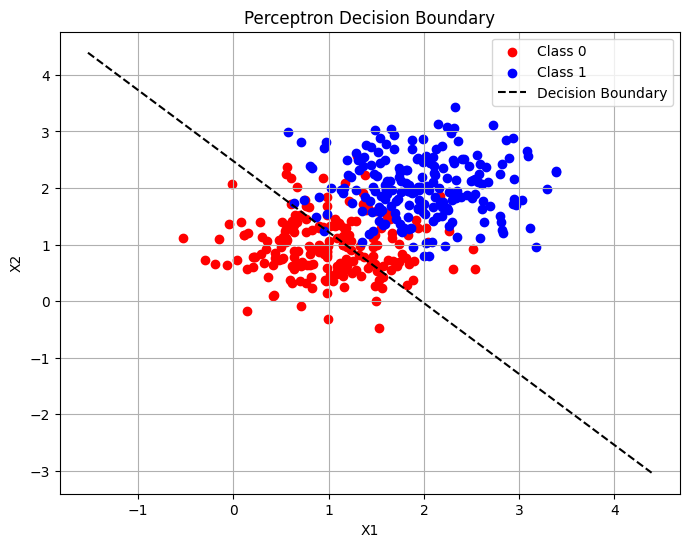

Least Squares Accuracy: 89.0


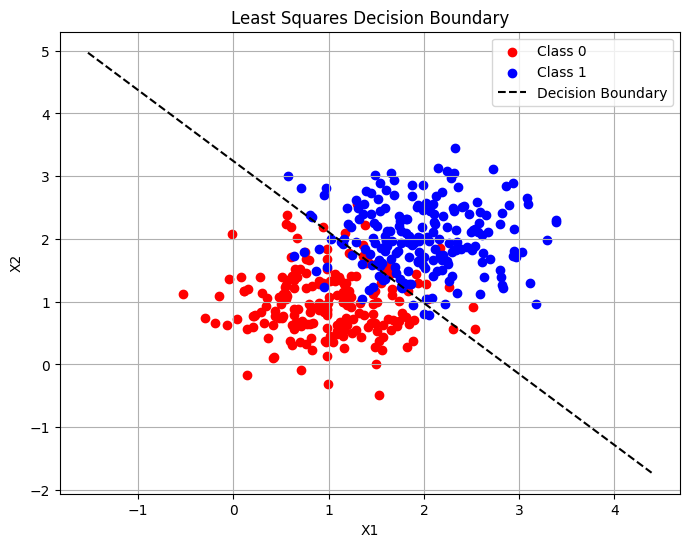

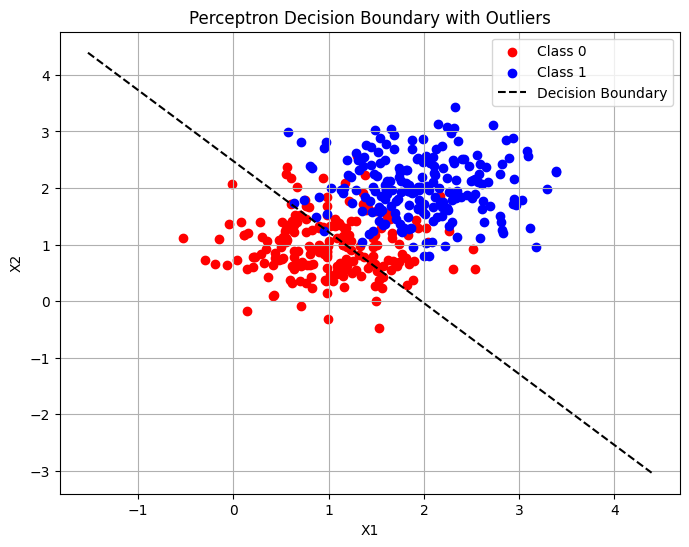

Perceptron Accuracy with Outliers: 81.25


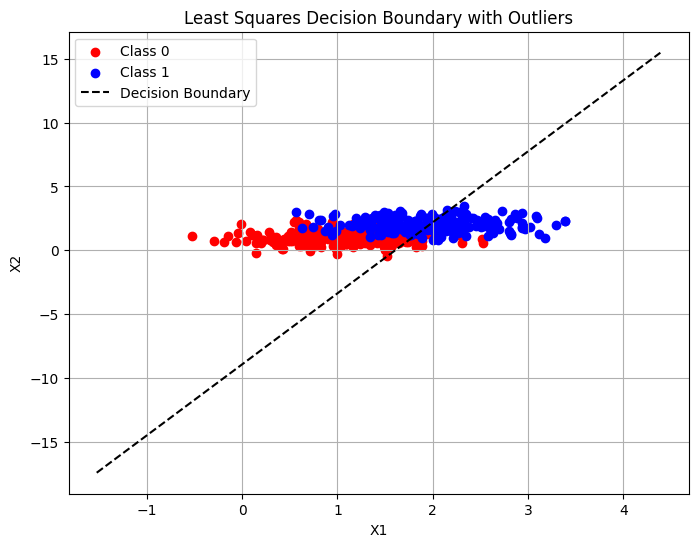

Least Squares Accuracy with Outliers: 69.5


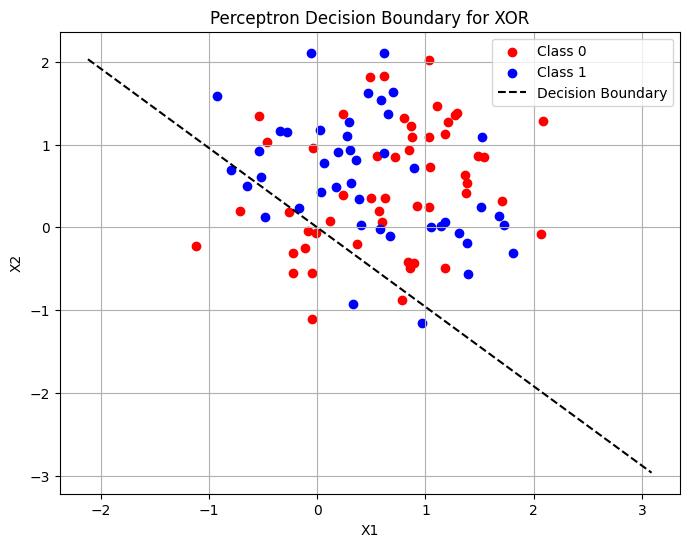

In [ ]:
########################################
#Part-3)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.



########################################
#Part-3)-(b)
########################################
def Perceptron(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, Testing data
    #Outputs: Testing data predictions, Weight vector representing the decision boundary

    epochs = 100    #Number of epochs
    X =  np.hstack((X_train, np.ones((X_train.shape[0], 1))))        #Data. Append ones to the training data to take care of the bias
    Y = np.where(Y_train == 0, -1, 1)
    w = np.zeros(X.shape[1])         #Initialize the weight vector
    for epoch in range(0,epochs,1):
        #Compute the predictions
        for i in range(X.shape[0]):
        #Compute the error
        #Update the weight vector
            if Y[i] * np.dot(w, X[i]) <= 0:
                w = w + Y[i] * X[i]

    #Compute the test data predicitions using the final weight vector
    X_test_bias = np.hstack((X_test, np.ones((X_test.shape[0], 1))))
    predictions = np.sign(np.dot(X_test_bias, w))
    predictions = np.where(predictions == -1, 0, 1)


    #Return the test data predictions and the final weight vector
    return predictions, w

predictions, w = Perceptron(tr_data, tr_targets, te_data)
acc = np.mean(predictions == te_targets)
print("Perceptron Accuracy:", acc * 100)

##########################################
#Plot the decision boundary using perceptron
##########################################

def plot_perceptron_decision_boundary(X, Y, w, title):
    plt.figure(figsize=(8, 6))
    plt.scatter(X[Y==0][:,0], X[Y==0][:,1], color='red', label='Class 0')
    plt.scatter(X[Y==1][:,0], X[Y==1][:,1], color='blue', label='Class 1')

    # Decision boundary: w1*x + w2*y + b = 0
    x_vals = np.linspace(min(X[:,0])-1, max(X[:,0])+1, 100)
    y_vals = -(w[0]*x_vals + w[2]) / w[1]
    plt.plot(x_vals, y_vals, 'k--', label='Decision Boundary')

    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_perceptron_decision_boundary(te_data, te_targets, w, 'Perceptron Decision Boundary')



##########################################
#Plot the decision boundary using least squares
##########################################

def least_squares(X_train, Y_train, X_test):
    X = np.hstack((X_train, np.ones((X_train.shape[0], 1))))
    y = np.where(Y_train == 0, -1, 1)
    w = np.linalg.pinv(X) @ y

    X_test_bias = np.hstack((X_test, np.ones((X_test.shape[0], 1))))
    predictions = np.sign(X_test_bias @ w)
    predictions = np.where(predictions == -1, 0, 1)

    return predictions, w

predictions_ls, w_ls = least_squares(tr_data, tr_targets, te_data)
accuracy_ls = np.mean(predictions_ls == te_targets)
print("Least Squares Accuracy:", accuracy_ls * 100)
plot_perceptron_decision_boundary(te_data, te_targets, w_ls, 'Least Squares Decision Boundary')

##########################################
#Part-3)-(c): Repeat the experiments with the true outliers added to the data. Compare and contrast the perceptron algorithm with least squares method
##########################################

outliers = np.random.multivariate_normal(mean=[30, 30], cov=[[0.3, 0], [0, 0.3]], size=10)
tr_data_outliers = np.vstack((tr_data, outliers))
tr_targets_outliers = np.hstack((tr_targets, np.ones(10)))

predictions_outliers, w_outliers = Perceptron(tr_data_outliers, tr_targets_outliers, te_data)
plot_perceptron_decision_boundary(te_data, te_targets, w_outliers, 'Perceptron Decision Boundary with Outliers')
accuracy_outliers = np.mean(predictions_outliers == te_targets)
print("Perceptron Accuracy with Outliers:", accuracy_outliers * 100)


predictions_outliers_ls, w_outliers_ls = least_squares(tr_data_outliers, tr_targets_outliers, te_data)
plot_perceptron_decision_boundary(te_data, te_targets, w_outliers_ls, 'Least Squares Decision Boundary with Outliers')
accuracy_outliers_ls = np.mean(predictions_outliers_ls == te_targets)
print("Least Squares Accuracy with Outliers:", accuracy_outliers_ls * 100)


##########################################
#Part-3)-(d): Data generation XOR
##########################################

#Set the parameters of Gaussian distribution
class1_mean1 = [0, 0]     #Mean of Gaussian1
class1_mean2 = [1, 1]     #Mean of Gaussian3
class2_mean1 = [0, 1]     #Mean of Gaussian2
class2_mean2 = [1, 0]     #Mean of Gaussian4
cov = [[0.3, 0], [0, 0.3]]  #Covariance matrix. Same covariance for class1 and class2

#Generate  data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution

class1_data1 = np.random.multivariate_normal(class1_mean1, cov, 60)
class1_data2 = np.random.multivariate_normal(class1_mean2, cov, 60)
class2_data1 = np.random.multivariate_normal(class2_mean1, cov, 60)
class2_data2 = np.random.multivariate_normal(class2_mean2, cov, 60)

#Obtain 2-class dataset
X = np.vstack((class1_data1, class1_data2, class2_data1, class2_data2))
Y = np.hstack((np.zeros(120), np.ones(120)))

#Create train test splits

index = np.arange(X.shape[0])
np.random.shuffle(index)
split = int(0.6 * len(index))
train_index = index[:split]
test_index = index[split:]

X_train = X[train_index]
Y_train = Y[train_index]
X_test = X[test_index]
Y_test = Y[test_index]

#Classify this dataset using perceptron algorithm

predictions_xor, w_xor = Perceptron(X_train, Y_train, X_test)

#Plot the decision boundary

plot_perceptron_decision_boundary(X_test, Y_test, w_xor, 'Perceptron Decision Boundary for XOR')




<b> Report your observations </b>

1.The perceptron and least squares classifiers both achieve high accuracy when classifying clean, linearly separable data. However, their decision boundaries differ slightly due to the way they handle margin and updates.

2.When outliers are introduced, the least squares method's decision boundary shifts significantly and becomes less reliable, whereas the perceptron is comparatively more reliable, maintaining a more reasonable separation between classes.

3.For XOR DATASET the perceptron fails to separate the classes correctly, as shown by the poor alignment of the decision boundary—highlighting that perceptron cannot solve problems that are not linearly separable.



<b> Part (4) : Understanding the decision boundaries of MAP approach to classification - </b> Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/x)$ = $p(c_{2}/x)$. Where $c_{1}$ and $c_{2}$ are the class indicators and $x$ is the data. With proper assumpuptions on prior and likelihood, p(c/x) follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mu_{1},\Sigma_{1},\mu_{2},\Sigma_{2}$, we can derive the decision boundary equation i.e W and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a). Class distributions share the same covariance matrix: Linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**b). Class distributions have different covariance matrices: Non-linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**c). Report your observations**




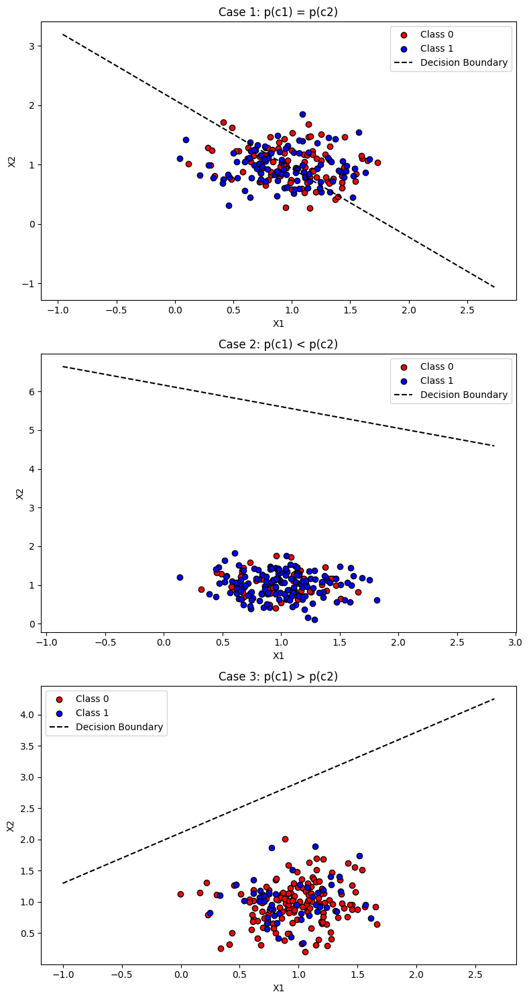

In [ ]:
##########################################
#Part-4a)-0: Data Generation
##########################################
m1 = np.array([1, 1])
m2 = np.array([1, 1])
cov = np.array([[0.1, 0.0], [0.0, 0.1]])

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution

class1_case1 = np.random.multivariate_normal(m1, cov, 100)
class2_case1 = np.random.multivariate_normal(m2, cov, 100)
data_case1 = np.vstack((class1_case1, class2_case1))
targets_case1 = np.hstack((np.zeros(100), np.ones(100)))

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution

class1_case2 = np.random.multivariate_normal(m1, cov, 50)
class2_case2 = np.random.multivariate_normal(m2, cov, 150)
data_case2 = np.vstack((class1_case2, class2_case2))
targets_case2 = np.hstack((np.zeros(50), np.ones(150)))

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution

class1_case3 = np.random.multivariate_normal(m1, cov, 150)
class2_case3 = np.random.multivariate_normal(m2, cov, 50)
data_case3 = np.vstack((class1_case3, class2_case3))
targets_case3 = np.hstack((np.zeros(150), np.ones(50)))


##########################################
#Part-4a)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = np.mean(Y_train == 0)
    p_c2 = 1. - p_c1

    mean_1 = np.mean(X_train[Y_train == 0], axis = 0)
    mean_2 = np.mean(X_train[Y_train == 1], axis = 0)

    cov1 = np.cov(X_train[Y_train == 0].T)
    cov2 = np.cov(X_train[Y_train == 1].T)

    cov = ( cov1 + cov2 ) / 2
    inverse_cov = np.linalg.inv(cov)
    w = inverse_cov @ (mean_1 - mean_2)
    w0 = - 0.5 * mean_1.T @ inverse_cov @ mean_1 + 0.5 * mean_2.T @ inverse_cov @ mean_2 + np.log(p_c1 / p_c2)

    return np.array([w0]+list(w))

#Plot the decision regions

def plot_decision_boundary(X, Y, params, ax, title):
    w0, w1, w2 = params
    x_vals = np.linspace(X[:, 0].min() - 1, X[:, 0].max() + 1, 100)
    y_vals = -(w0 + w1 * x_vals) / w2

    ax.scatter(X[Y == 0, 0], X[Y == 0, 1], color='red', edgecolors='k', label='Class 0')
    ax.scatter(X[Y == 1, 0], X[Y == 1, 1], color='blue', edgecolors='k', label='Class 1')
    ax.plot(x_vals, y_vals, 'k--', label='Decision Boundary')
    ax.set_title(title)
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.legend()

# Create 3 subplots arranged vertically
fig, axes = plt.subplots(3, 1, figsize=(8, 15))  # 3 rows, 1 column

params1 = decisionBoundary(data_case1, targets_case1)
plot_decision_boundary(data_case1, targets_case1, params1, axes[0], "Case 1: p(c1) = p(c2)")

params2 = decisionBoundary(data_case2, targets_case2)
plot_decision_boundary(data_case2, targets_case2, params2, axes[1], "Case 2: p(c1) < p(c2)")

params3 = decisionBoundary(data_case3, targets_case3)
plot_decision_boundary(data_case3, targets_case3, params3, axes[2], "Case 3: p(c1) > p(c2)")

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random
import math

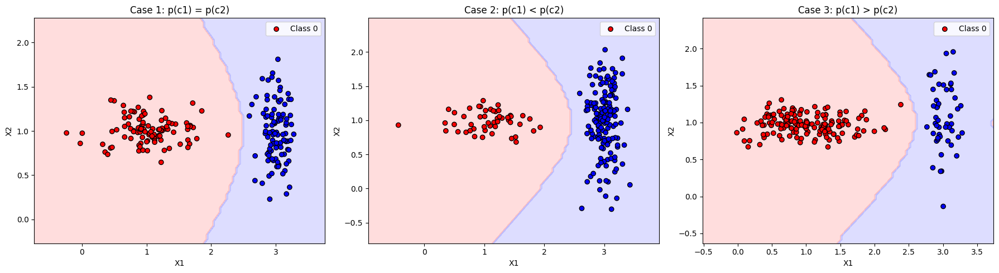

In [ ]:
##########################################
#Part-4b)-0: Data Generation
##########################################

m1 = np.array([1, 1])
m2 = np.array([3, 1])
cov1 = np.array([[0.2, 0], [0.0, 0.02]])
cov2 = np.array([[0.02, 0], [0.0, 0.2]])

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_case1 = np.random.multivariate_normal(m1, cov1, 100)
class2_case1 = np.random.multivariate_normal(m2, cov2, 100)
data_case1 = np.vstack((class1_case1, class2_case1))
targets_case1 = np.hstack((np.zeros(100), np.ones(100)))


#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_case2 = np.random.multivariate_normal(m1, cov1, 50)
class2_case2 = np.random.multivariate_normal(m2, cov2, 150)
data_case2 = np.vstack((class1_case2, class2_case2))
targets_case2 = np.hstack((np.zeros(50), np.ones(150)))


#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution

class1_case3 = np.random.multivariate_normal(m1, cov1, 150)
class2_case3 = np.random.multivariate_normal(m2, cov2, 50)
data_case3 = np.vstack((class1_case3, class2_case3))
targets_case3 = np.hstack((np.zeros(150), np.ones(50)))

##########################################
#Part-4b)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train, X_test):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = np.sum(Y_train == 0) / len(Y_train)
    p_c2 = 1. - p_c1

    mean_1 = np.mean(X_train[Y_train == 0], axis = 0)
    mean_2 = np.mean(X_train[Y_train == 1], axis = 0)

    cov1 = np.cov(X_train[Y_train == 0].T)
    cov2 = np.cov(X_train[Y_train == 1].T)

    inv_cov1 = np.linalg.inv(cov1)
    inv_cov2 = np.linalg.inv(cov2)

    det_cov1 = np.linalg.det(cov1)
    det_cov2 = np.linalg.det(cov2)

    predictions = []

    for x in X_test:
        # Compute QDA score for each class
        term1_lhs = -0.5 * (x - mean_1).T @ inv_cov1 @ (x - mean_1)
        term2_lhs = -0.5 * np.log(det_cov1)
        LHS = term1_lhs + term2_lhs + np.log(p_c1)

        term1_rhs = -0.5 * (x - mean_2).T @ inv_cov2 @ (x - mean_2)
        term2_rhs = -0.5 * np.log(det_cov2)
        RHS = term1_rhs + term2_rhs + np.log(p_c2)

        pred = 0 if LHS > RHS else 1
        predictions.append(pred)

    #Compute predictions on test data

    return np.array(predictions)

#Plot the decision regions

def plot_decision_boundary(data, labels, title, ax):
    h = 0.05  # step size
    x_min, x_max = data[:, 0].min() - 0.5, data[:, 0].max() + 0.5
    y_min, y_max = data[:, 1].min() - 0.5, data[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = decisionBoundary(data, labels, grid)
    Z = Z.reshape(xx.shape)

    ax.contourf(xx, yy, Z, alpha=0.4, cmap=ListedColormap(['#FFAAAA', '#AAAAFF']))
    ax.scatter(data[:, 0], data[:, 1], c=labels, cmap=ListedColormap(['red', 'blue']), edgecolor='k')
    ax.legend(['Class 0', 'Class 1'])
    ax.set_title(title)
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('X1')
    ax.set_ylabel('X2')

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

plot_decision_boundary(data_case1, targets_case1, "Case 1: p(c1) = p(c2)", axes[0])
plot_decision_boundary(data_case2, targets_case2, "Case 2: p(c1) < p(c2)", axes[1])
plot_decision_boundary(data_case3, targets_case3, "Case 3: p(c1) > p(c2)", axes[2])

plt.tight_layout()
plt.show()


<b> Report your observations </b>

1.In part (a), the LDA boundary is linear because we assume shared covariance, while in part (b), QDA creates curved boundaries due to different covariances for each class

2.Changing class priors shifts the decision boundary toward the less likely class. We saw this clearly in both LDA and QDA where increasing p(c2) pulled the boundary toward class 1 and vice versa

3.In both parts, the classes are well separated in most cases, but the boundary fits better with QDA when classes have different spreads, showing that QDA adapts more flexibly to data geometry.



<b> Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ): </b> logistic regression model: $y = \frac{1}{1+e^{-\textbf{w}^{T}\textbf{x}}}$. With the provided training data, X_train and Y_train, your task is to identify the optimal $\textbf{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\textbf{w}$ can be applied to predict outcomes on the test data, X_test.





a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\textbf{w}$ using the training data. You can initialize $\textbf{w}$ with random values and iteratively update it to determine the optimal $\textbf{w}$. Subsequently, this optimal $\textbf{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.


f). Report your observations




 Accuracy with Logistic Regression: 89.0 




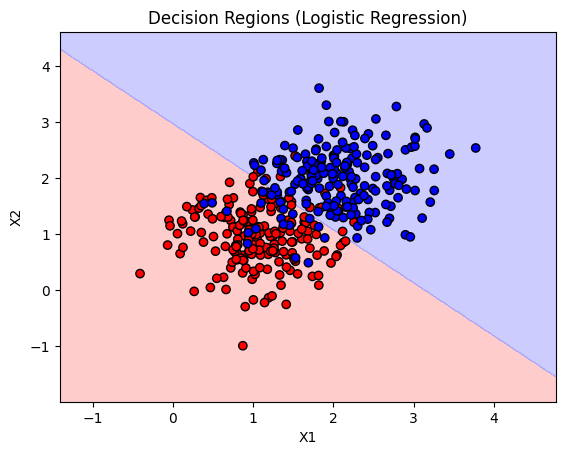

[[30.26538284 29.97829322]
 [30.94618727 29.51246505]
 [31.00769644 29.7409125 ]
 [30.3431183  30.1353025 ]
 [30.00750524 30.35079256]
 [29.15345643 30.81303768]
 [29.57367398 30.46032348]
 [29.96898406 29.59878717]
 [30.41440993 30.23326105]
 [29.77619046 29.86504078]]


 Accuracy with Logistic Regression with Outliers: 84.75 


Least Squares Accuracy with Outliers: 48.5


<ipython-input-22-6a09bf7d22e6>:33: RuntimeWarning: overflow encountered in exp
  return 1/ (1 + np.exp(-x))


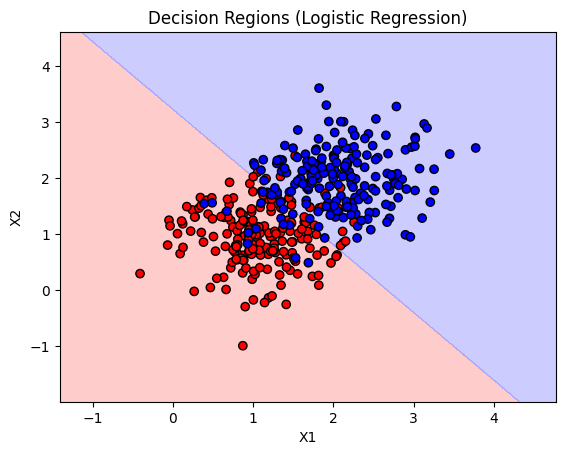

Logistic Regression with Outliers


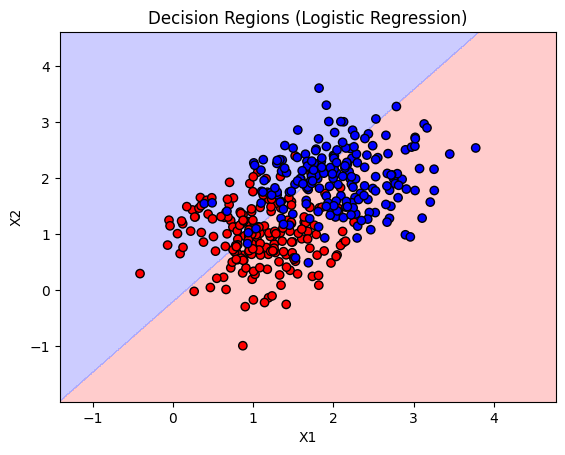

Least Squares with Outliers


In [ ]:
##################################################
#Part-5)-1: Data generation
##################################################

#Set the parameters of class distribution
mean1 = [1, 1]           #Mean of class1
mean2 = [2, 2]           #Mean of class2
cov = [[0.3, 0.0], [0.0, 0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data =  np.vstack((class1_tr, class2_tr))             #Combine class1 training and class2 training data to get total training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.


##################################################
#Part-5)-b: Complete the below logistic regression function
##################################################



def Logistic_Regression(X_train, Y_train, X_test = None, return_weights=False):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Predictions on test data
    def sigmoid(x):
        return 1/ (1 + np.exp(-x))

    max_iter = 100 #max number of ierations for parameter update
    threshold = 0.5 #threshold for classification
    X = np.hstack((np.ones((X_train.shape[0], 1)), X_train))         #Data. Append ones to the training data to take care of the bias
    w = np.random.randn(X.shape[1])         #Initialize the weight vector
    for iter in range(0,max_iter,1):
      preds = sigmoid(X @ w)   #Predictions on X. Sigmoid(w^T.x)
      error = Y_train - preds   #Difference between preds and Y_train

      #Compute the gradients and the appropriate learning rate. We can use Hessian matrix as learning rate
      R = np.diag(preds * (1 - preds))
      gradient = X.T @ error
      hessian = X.T @ R @ X
      try:
            hessian_inv = np.linalg.inv(hessian)
      except np.linalg.LinAlgError:
            break

      #Update the weight vector
      w = w + hessian_inv @ gradient
    if return_weights:
        return w
    if X_test is not None:
        #Test data predictions
        X_test_bias = np.hstack((np.ones((X_test.shape[0], 1)), X_test))
        test_prdictions_probability = sigmoid(X_test_bias @ w)

        #Compare the predictions with 0, to output the decision
        test_predictions = (test_prdictions_probability >= threshold).astype(int)

        #Return the predicted test labels
        return test_predictions


Y_pred = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
#Part-5)-c:
###############################################
def LR_Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth and predicted lables of test data
    #Outputs: Accuracy
    accuracy = np.mean(Y_test == Y_pred) * 100
    #Compute and return the accuracy
    return accuracy


accuracy_LR = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', accuracy_LR, '\n\n')


##########################################
#Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################

def plot_decision_region(X, y, model_func):
    h = 0.01
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model_func(grid)
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, cmap=ListedColormap(['#FFAAAA', '#AAAAFF']), alpha=0.6)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap=ListedColormap(['red', 'blue']))
    plt.title("Decision Regions (Logistic Regression)")
    plt.xlabel("X1")
    plt.ylabel("X2")
    plt.show()

# For plotting, use the same logistic regression model
trained_weights = Logistic_Regression(tr_data, tr_targets, return_weights=True)

def model_for_plot(X):
    X_bias = np.hstack((np.ones((X.shape[0], 1)), X))
    preds = 1 / (1 + np.exp(-X_bias @ trained_weights))
    return (preds >= 0.5).astype(int)

plot_decision_region(te_data, te_targets, model_for_plot)


##########################################
#Part-5)-e: Logistic regression for the data with true outliers
##########################################

outliers = np.random.multivariate_normal(mean=[30, 30], cov=[[0.3, 0], [0, 0.3]], size=10)
tr_data_outliers = np.vstack((tr_data, outliers))
tr_targets_outliers = np.hstack((tr_targets, np.zeros(10)))

Y_pred_outliers_lr = Logistic_Regression(tr_data_outliers, tr_targets_outliers, te_data)
accuracy_outliers_lr = LR_Accuracy(te_targets, Y_pred_outliers_lr)
print('\n\n Accuracy with Logistic Regression with Outliers:', accuracy_outliers_lr, '\n\n')

def Least_Squares_Classifier(X_train, Y_train, X_test):
    X = np.hstack((np.ones((X_train.shape[0], 1)), X_train))
    w = np.linalg.pinv(X) @ Y_train
    X_test_ext = np.hstack((np.ones((X_test.shape[0], 1)), X_test))
    predictions = X_test_ext @ w
    return (predictions >= 0.5).astype(int)

Y_pred_outliers_ls = Least_Squares_Classifier(tr_data_outliers, tr_targets_outliers, te_data)
accuracy_outliers_ls = LR_Accuracy(te_targets, Y_pred_outliers_ls)
print('Least Squares Accuracy with Outliers:', accuracy_outliers_ls)

def plot_model_comparison(model_func, title):
    def model(X):
        return model_func(tr_data_outliers, tr_targets_outliers, X)
    plot_decision_region(te_data, te_targets, model)
    print(title)

plot_model_comparison(Logistic_Regression, "Logistic Regression with Outliers")
plot_model_comparison(Least_Squares_Classifier, "Least Squares with Outliers")





<b> Report your observations </b>

1.The logistic regression model achieved high accuracy  on the test set, meaning it was able to separate the two Gaussian classes effectively.

2The decision boundary from logistic regression was smooth and nicely separated the two classes in the 2D plot, with red and blue regions showing distinct separation.

3.After adding outliers to the training data, the least squares classifier was more affected than logistic regression, with logistic regression maintaining higher accuracy and a better-aligned boundary



<b> Part (6) : Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm </b>


<dt> <b> a. Generating synthetic data : </b>  This part describes the steps involved in generating the synthetic data. </dt>


<dt>  1. Let us consider the GMM with Bivariate Gaussians   </dt>
<dd>  - Choose the appropriate means ($\mu$), covariances ($\Sigma$), and weights ($\pi$) of Bivariate Gaussian distributions. You may choose the following parameters for this asignment.  </dd>
<br>
<dt>  <center> $ \pi = \begin{bmatrix} 0.6  \\ 0.4 \end{bmatrix} \;\;\;\; \mu_{1} = \begin{bmatrix} -1.0  \\ -1.0 \end{bmatrix} \;\;\;\; \mu_{2} = \begin{bmatrix} 1.0  \\ 1.0 \end{bmatrix} \;\;\;\; $ </center>   </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{full} = \begin{bmatrix} 0.15 & 0.1  \\ 0.1 & 0.25 \end{bmatrix} \;\;\;\; \Sigma_{2}^{full} = \begin{bmatrix} 0.3 & -0.25  \\ -0.25 & 0.25 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{diagonal} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{diagonal} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{spherical} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{spherical} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>

<dd>  - Pick one Gaussian following the selection probability as  $\pi$    </dd>
<dd>  - Sample the data point from the selected Bivariate Gaussian distribution    </dd>
<dd>  - Repeat the process N times to get the entire data set  </dd>
<dt>  2.Create the synthetic data set with the number of mixtures as 2.  </dt>
<dt>  3.Plot the synthetic data set with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM  </h4> </dt> </dd>

<dt> <b> b. Implementation of Expectation and Maximization (EM) algorithm : </b> This part focuses on implementing the EM algorithm from scratch to estimate the parameters of the Gaussian Mixture Model (GMM). </dt>  

<dt>  1. Chose the number of mixtures (M) and initialize the parameters of GMM model  </dt>
<dd>  - Make sure that the diagonal elements of covariance are positive, and the weights of Gaussians are positive and sum to 1 for satisfying the axioms of probability.  </dd>

<dt>   2. Expectation step :  Evaluate the responsibility of Gaussians in generating the data points using the current estimated parameters i.e $\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$, here k indicates the Gaussian in GMM  </dt>
<br>

<dd>  <center> $\gamma_{nk} = \frac{\pi_{k} N ( \textbf{x}_{n} / \mu_{k} , \Sigma_{k} )}{ \sum_{m=1}^{M} \pi_{m} N ( x_{n} / \mu_{m} , \Sigma_{m} ) }    \;\;\;\;\;\; ∀ \;\;k=1,2,...,M \;\; and \;\; n=1,2,...,N$  </center>  </dd>

<br>

<dd>   Where N is the total number of data points and M is the total number of Gaussians in GMM   </dd>

<dd>   - $\gamma_{nk}$ represents the responsibility of $k^{th}$ Gaussian in generating the $n^{th}$ data point   </dd>

<dd>   - $\sum_{n=1}^{N}$ $\gamma_{nk}$ represents the the effective number of data points generated by $k^{th}$ Gaussian   </dd>


<dt>   3. Maximization step :  Update the parameters ($\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$) of GMM using the current resosibilities ($\gamma_{nk}$) by maximizing the likelihood. </dt>

<dd>
 - Effective number of data points generated by $k^{th}$ Gaussian : $N_{k}$ = $\sum_{n=1}^{N}$ $\gamma_{nk}$   
 </dd>

<dd>
 - Mean of $k^{th}$ Gaussian : $\hat{\mu_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N}\gamma_{nk} x_{n}$   
 </dd>

<dd>
 - Covariance of $k^{th}$ Gaussian : $\hat{\Sigma_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} ( x_{n} - \hat{\mu_{k}} )( x_{n} - \hat{\mu_{k}} )^{T}$   
 </dd>

<dd>
 - Weight of $k^{th}$ Gaussian : $\hat{\pi_{k}} = \frac{N_{k}}{N}$  
 </dd>

<dt>  4. Compute the log-likelihood with the updated parameters  </dt>
<dt>   5. Repeat the expectation and maximization steps untill convergence  </dt>

<dt>  <b> c. Illustration of EM iterations </b>  </dt>

<dt>   5. Plot the contours of the estimated distributions over the iterations in the EM algorithm and overlay the data points.  </dt>

<dt>  <b> d. Understanding the issues with EM algorithm </b>  </dt>
<dt>   6. Check the influence of initialization on the convergence of the EM algorithm and fit quality.  </dt>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section    </dd>
<dt>   6. Check the influence of the type of covariance matrix on the convergence of the EM algorithm and fit quality . </dt>
<dd>   - Execute the EM algorithm with different covariance matrices i.e Spherical, Diagonal and Full covariance  </dd>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section  </dd>


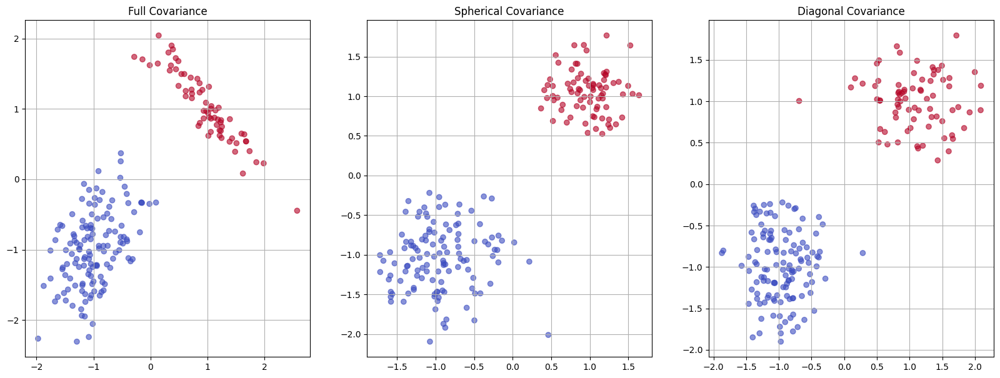

In [ ]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-a: Generating synthetic data
##########################################

def generateData(pi, mu, sigma, N):
    ############################################################################
    #pi = weights of Gaussians, mu = mean of Gaussians, sigma = convariance of Gaussians, N = number of data points
    #Steps
    #1.Select th Gaussian following the probability distribution as pi
    #2.Sample the data points from the selected Gaussian
    #3.Repeat the process N times to get N data points
    #4.Return the sampled data
    ############################################################################
    #You may look into "random.choices" and "np.random.multivariate_normal" functions

    data = []
    labels = []

    for _ in range(N):
        k = rand.choices([0, 1], weights = pi)[0]
        sample = np.random.multivariate_normal(mu[k], sigma[k])
        data.append(sample)
        labels.append(k)

    return np.asarray(data), np.asarray(labels)
    ############################################################################


############################################################################
#Chose the appropriate means ($\mu$), covariances ($\Sigma$), and weights
############################################################################
mu1 = [-1.0, -1.0]   #Mean vector of component1 in GMM
sig1 = [[0.15, 0.1], [0.1, 0.25]]  #Full covariance matrix of component1 in GMM
mu2 = [1.0, 1.0]   #Mean vector of component2 in GMM
sig2 = [[0.3, -0.25], [-0.25, 0.25]]  #Full covariance matrix of component2 in GMM
pi = [0.6, 0.4]    #Prior probabilities

n_points = 200 #Number of points

# Spherical covariances
sig1_s = [[0.2, 0.0], [0.0, 0.2]]
sig2_s = [[0.1, 0.0], [0.0, 0.1]]
# Diagonal covariances
sig1_d = [[0.1, 0.0], [0.0, 0.2]]
sig2_d = [[0.2, 0.0], [0.0, 0.1]]

############################################################################
#Create the synthetic data set
############################################################################

data_full, labels_full = generateData(pi, [mu1, mu2], [sig1, sig2], 200)
data_sp, labels_sp = generateData(pi, [mu1, mu2], [sig1_s, sig2_s], 200)
data_dg, labels_dg = generateData(pi, [mu1, mu2], [sig1_d, sig2_d], 200)

############################################################################
#Plot the synthetic data set
############################################################################

fig, ax = plt.subplots(1,3, figsize=(20,7))

#Visualize the data sampled from the GMM with full covariance matrix
ax[0].scatter(data_full[:, 0], data_full[:, 1], c=labels_full, cmap='coolwarm', alpha=0.6)
ax[0].set_title('Full Covariance')
ax[0].grid(True)

#Visualize the data sampled from the GMM with spherical covariance matrix
ax[1].scatter(data_sp[:, 0], data_sp[:, 1], c=labels_sp, cmap='coolwarm', alpha=0.6)
ax[1].set_title('Spherical Covariance')
ax[1].grid(True)

#Visualize the data sampled from the GMM with diagonal covariance matrix
ax[2].scatter(data_dg[:, 0], data_dg[:, 1], c=labels_dg, cmap='coolwarm', alpha=0.6)
ax[2].set_title('Diagonal Covariance')
ax[2].grid(True)

plt.show()


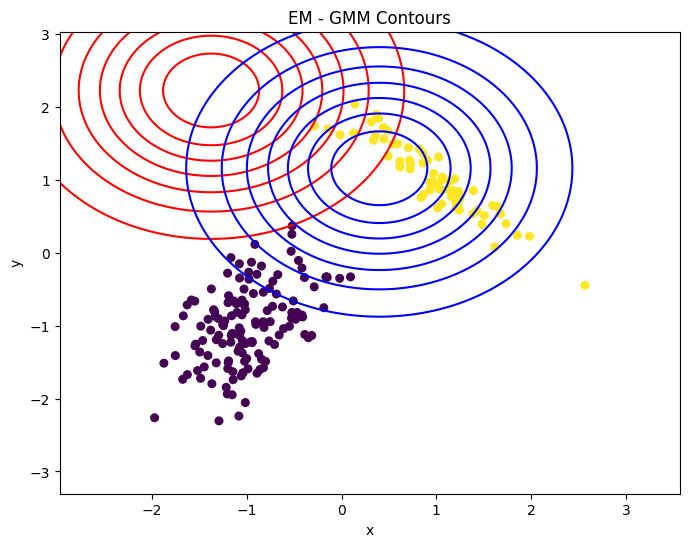

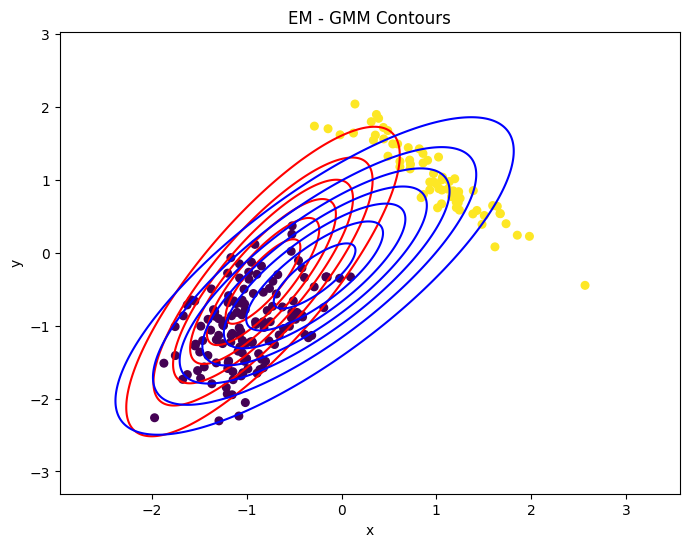

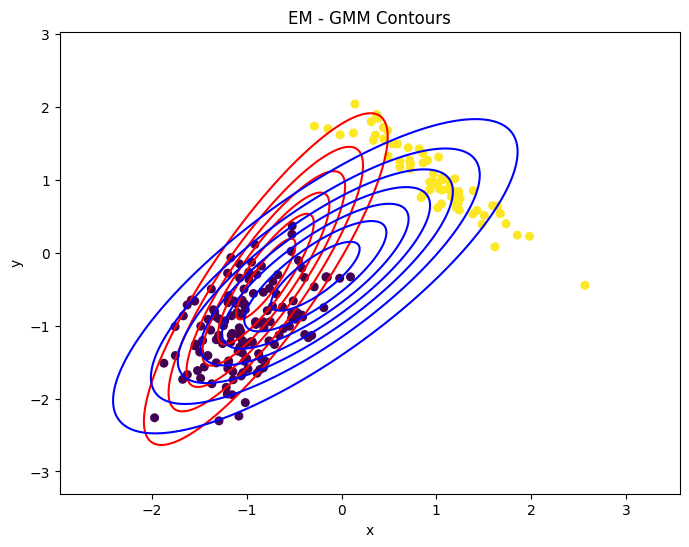

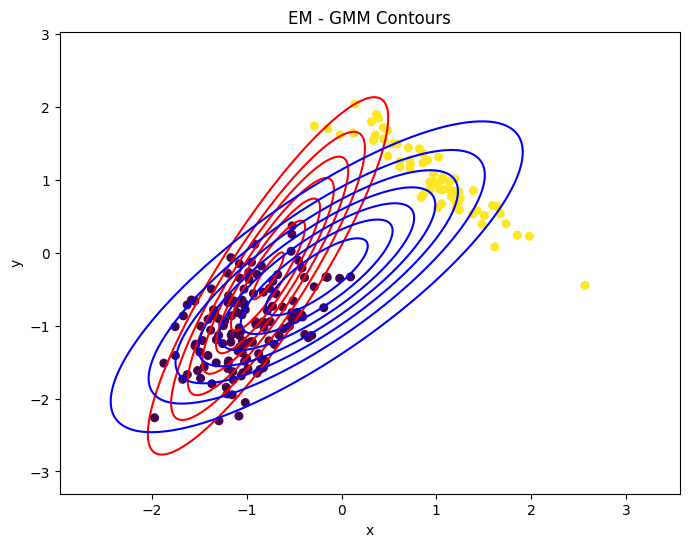

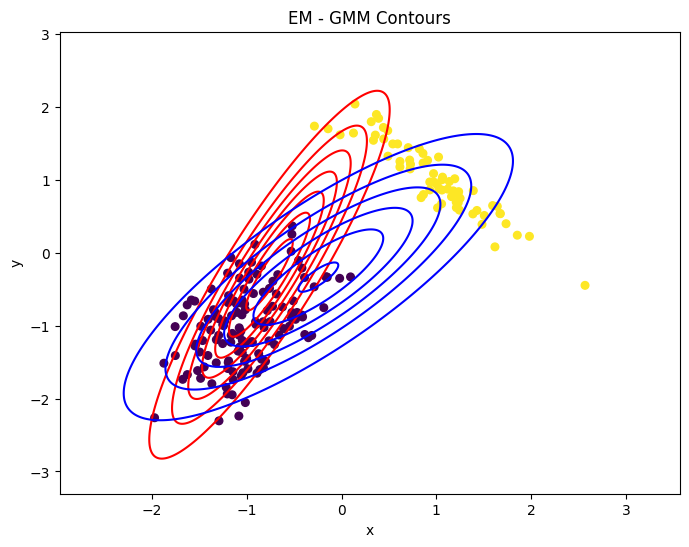

...

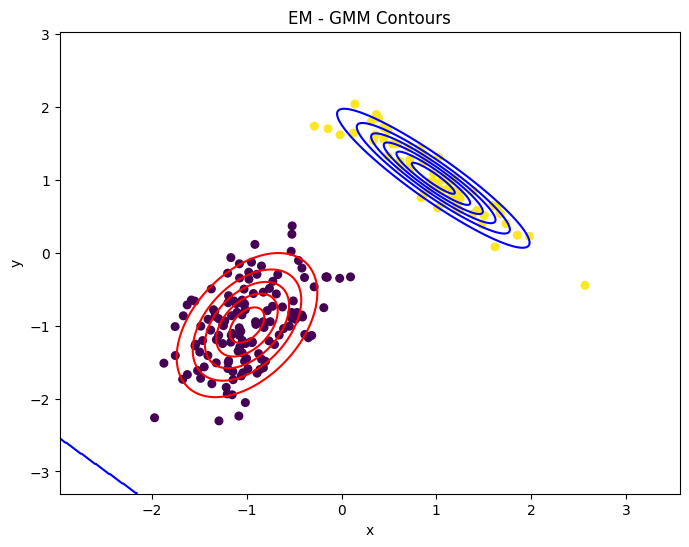

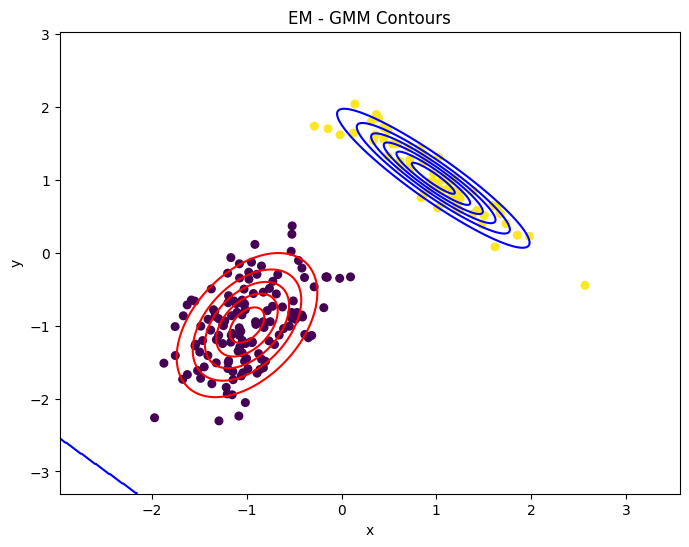

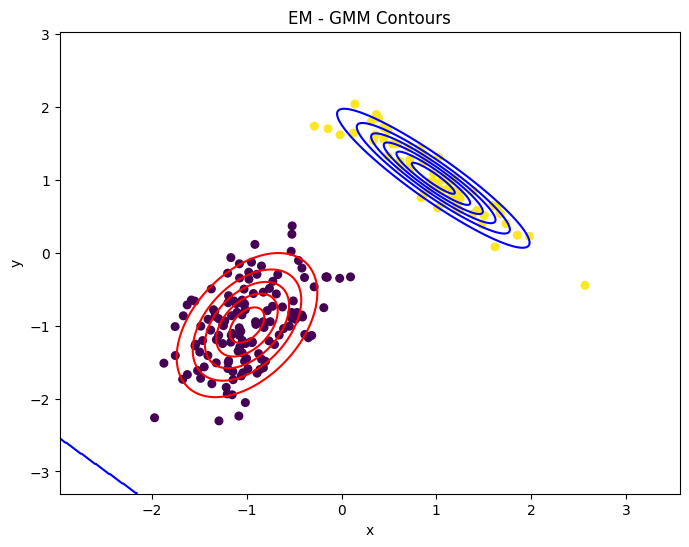

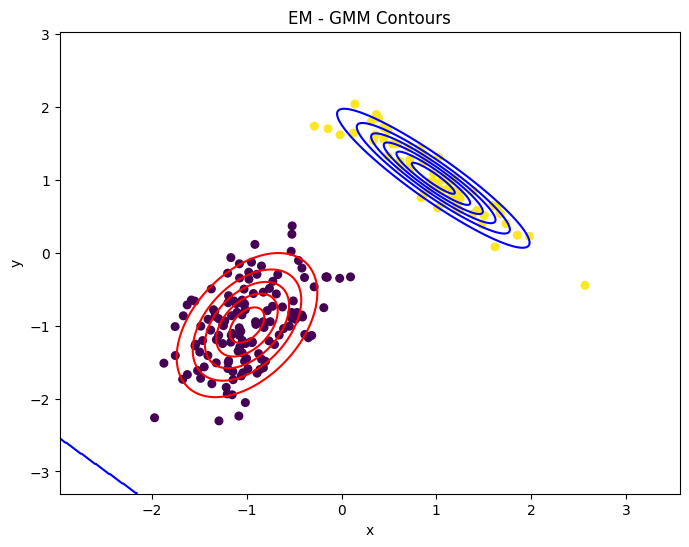

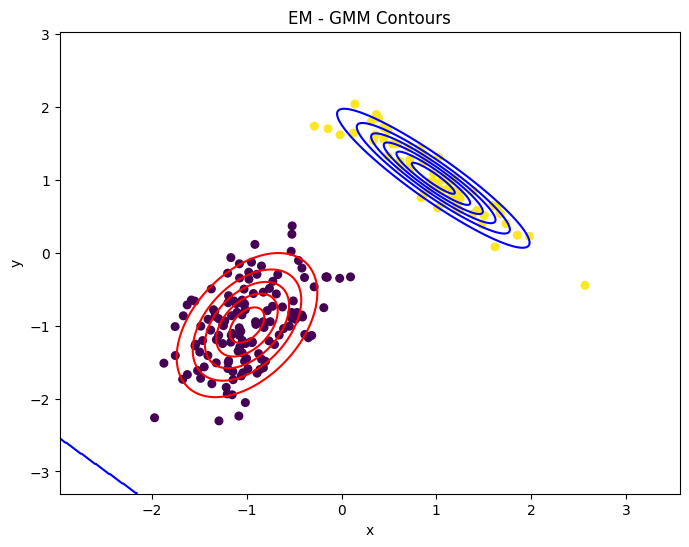

In [ ]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-b: Implimentation of Expectation-Maximization (EM) algorithm
##########################################

############################################################################
#Write a function to compute the log-likelihood of the data given the parameters
############################################################################
def likelihood(data, pi, mu, sigma, log_likelihood=False, likelihoods=False):
    # Inputs: data, parameters of GMM model
    # Outputs: likelihood

    N = len(data)
    M = len(pi)
    total_likelihood = 0
    likelihood_matrix = np.zeros((N, M))

    for k in range (M):
        likelihood_matrix[:, k] = pi[k] * multivariate_normal.pdf(data, mean = mu[k], cov = sigma[k])

    likelihood_sum = np.sum(likelihood_matrix, axis = 1)
    total_likelihood = np.sum(np.log(likelihood_sum))

    if log_likelihood:
        return total_likelihood
    elif likelihoods:
        return likelihood_matrix
    else:
        return np.exp(total_likelihood)

############################################################################
#Write a function for the expectation step
############################################################################
def expectation(data, pi, mu, sigma):
    #Inputs: data, parameters of GMM model
    #Outputs: gamma
    N = len(data)
    M = len(pi)
    gamma = np.zeros((N, M))

    for n in range(N):
      #Iterate through the data points
      denominator = 0
      for k in range (M):
          denominator = denominator + pi[k] * multivariate_normal.pdf(data[n], mean = mu[k], cov = sigma[k] )
      for k in range(M):
        #Iterate through the components in GMM
        numerator = pi[k] * multivariate_normal.pdf(data[n], mean = mu[k], cov = sigma[k])
        gamma[n,k] = numerator/denominator
    return gamma



############################################################################
#Write a function for the maximization step.
############################################################################
def maximization(data, gamma):
    #Inputs: data, gamma
    #Outputs: Updated parameters of GMM model
    N, D = data.shape
    M = gamma.shape[1]

    #Update pi
    N_k = np.sum(gamma, axis = 0)
    pi = N_k / N

    #Update mu
    mu = np.dot(gamma.T, data) / N_k[:, np.newaxis]

    #Update sigma

    sigma = []
    for k in range(M):
        diff = data - mu[k]
        weighted_sum = np.dot((gamma[:, k][:, np.newaxis] * diff).T, diff)
        sigma_k = weighted_sum / N_k[k]
        sigma.append(sigma_k)

    #Return the parameters of GMM model
    return pi, mu, sigma


#Complete the below function. It plots the contours
def plot_contours(data, labels, pi, mu, sigma):
    plt.figure(figsize=(8, 6))
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', s=30)
    colors = ['red', 'blue', 'green', 'purple']
    for k in range(len(pi)):
        rv = multivariate_normal(mean=mu[k], cov=sigma[k])
        x, y = np.mgrid[np.min(data[:, 0])-1:np.max(data[:, 0])+1:.01, np.min(data[:, 1])-1:np.max(data[:, 1])+1:.01]
        pos = np.dstack((x, y))
        plt.contour(x, y, rv.pdf(pos), colors=colors[k % len(colors)])
    plt.title("EM - GMM Contours")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()



############################################################################
#Run the expectation and maximzation algorithm to estimate the parameters
############################################################################
data = data_full     #data to run EM-algorithm
labels = labels_full  #labels
N, D = data.shape       #number of input examples        #data dimension
M = 2       #no.of components in GMM

pi = np.ones(M) / M      #Initialize the prior probabilities
mu = np.random.randn(M, D)      #Initialize the mean vectors
sigma = [np.eye(D) for _ in range(M)]    #Initialize the covariance matrices


nsteps = 30  #Number of steps to run EM algorithm
for index in range(0,nsteps,1):

  #Compute the likelihood
  ll = likelihood(data, pi, mu, sigma, log_likelihood=True)

  #Plot the contours
  plot_contours(data, labels, pi, mu, sigma)

  #Expectation step
  gamma = expectation(data, pi, mu, sigma)

  #Maximization step
  pi, mu, sigma = maximization(data, gamma)





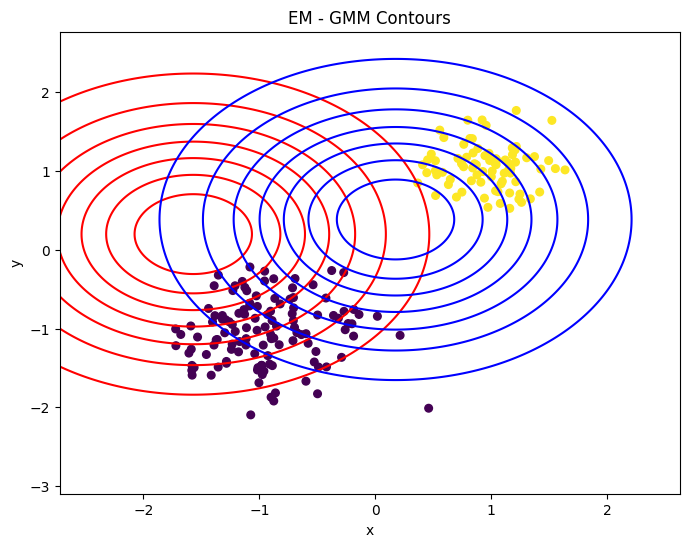

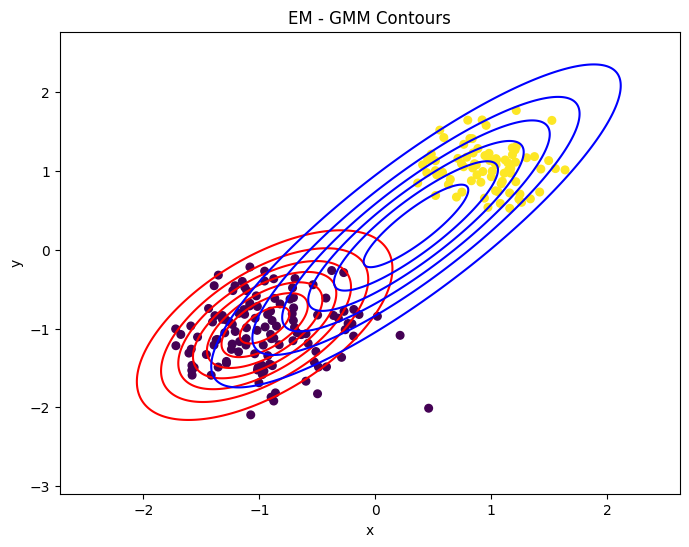

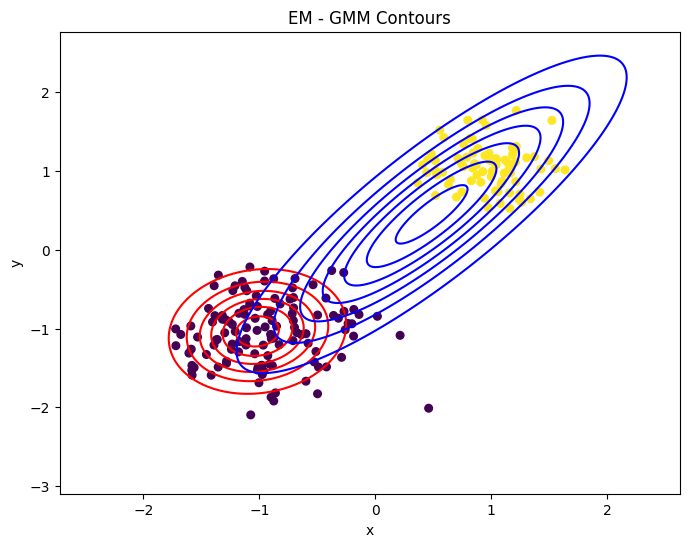

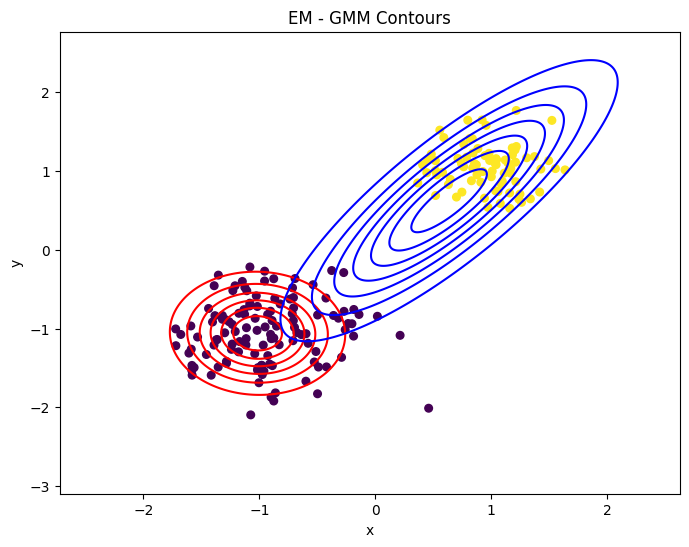

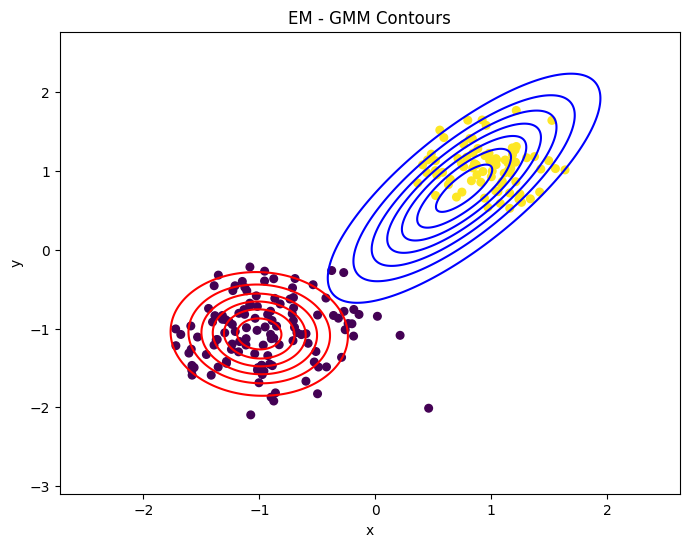

...

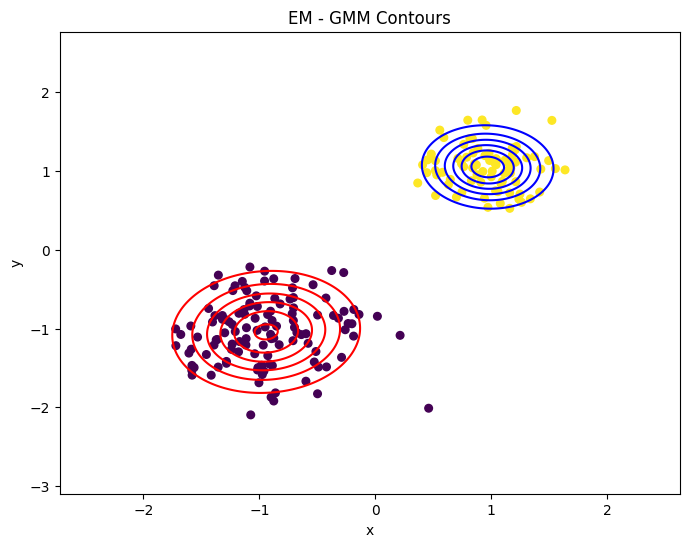

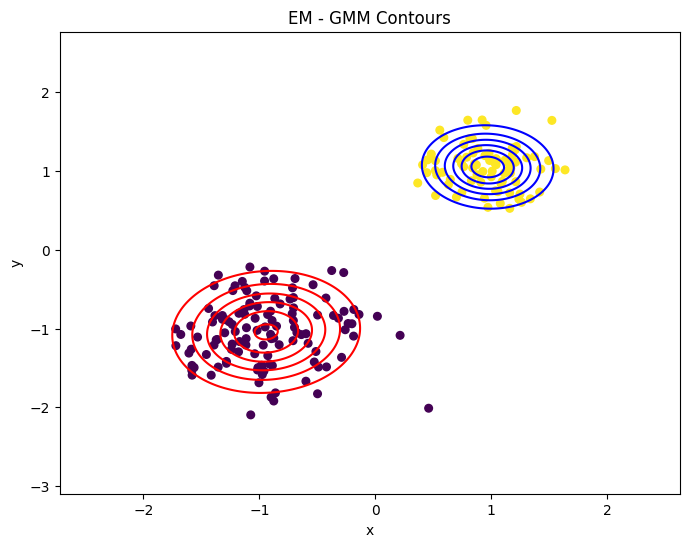

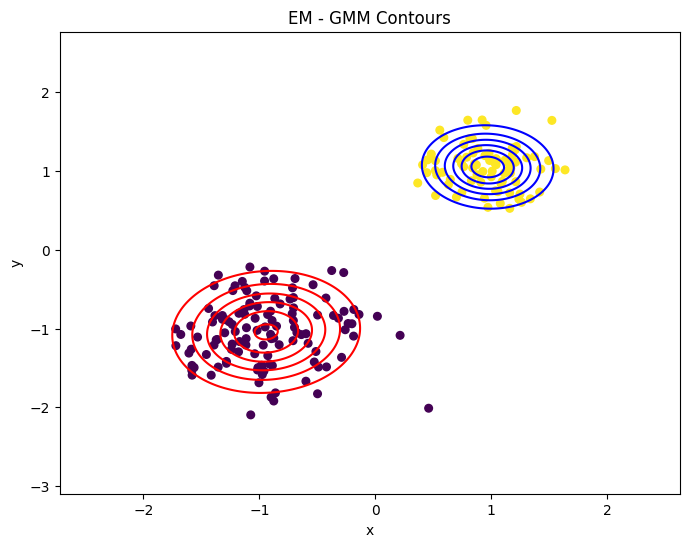

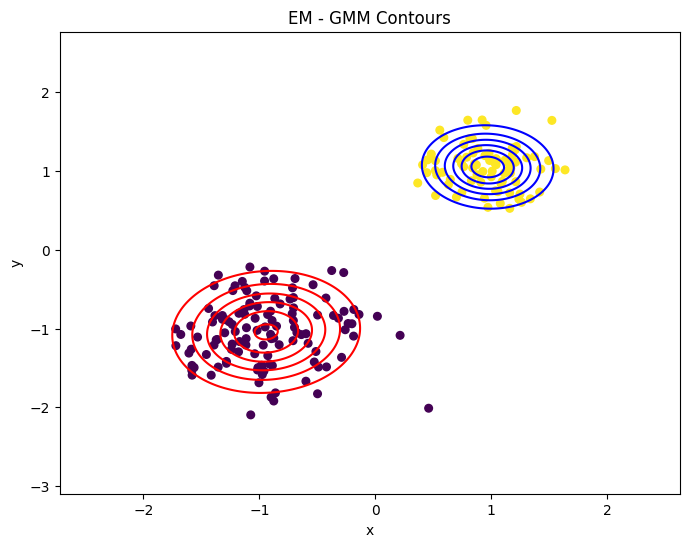

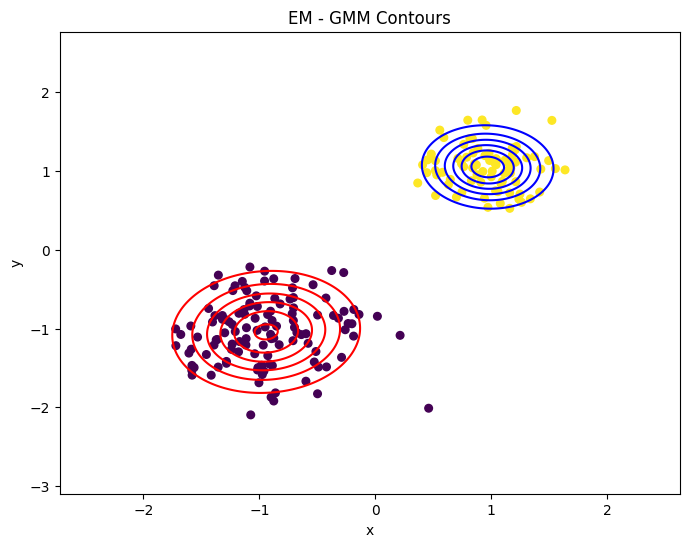

In [ ]:
############################################################################
##Part-6)-d: Understand the issues with EM algorithm
############################################################################

data = data_sp        #data to run EM-algorithm
labels = labels_sp  #labels
N, D = data.shape       #number of input examples        #data dimension
M = 2       #no.of components in GMM

pi = np.ones(M) / M      #Initialize the prior probabilities
mu = np.random.randn(M, D)      #Initialize the mean vectors
sigma = [np.eye(D) for _ in range(M)]    #Initialize the covariance matrices


nsteps = 30  #Number of steps to run EM algorithm
for index in range(0,nsteps,1):

  #Compute the likelihood
  ll = likelihood(data, pi, mu, sigma, log_likelihood=True)

  #Plot the contours
  plot_contours(data, labels, pi, mu, sigma)

  #Expectation step
  gamma = expectation(data, pi, mu, sigma)

  #Maximization step
  pi, mu, sigma = maximization(data, gamma)





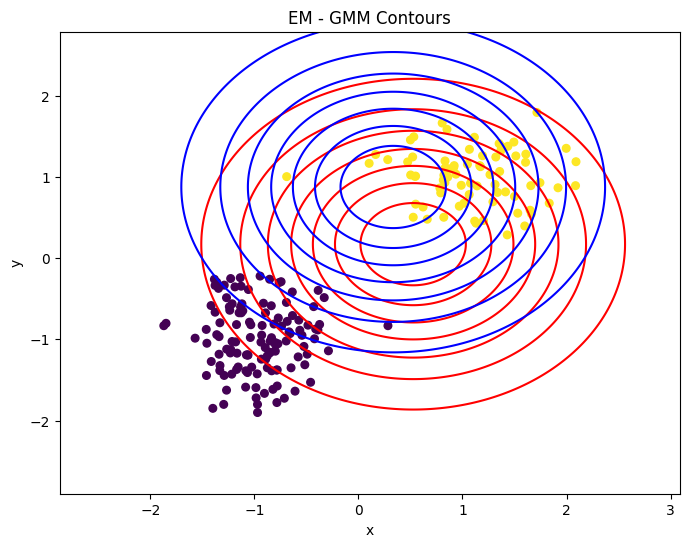

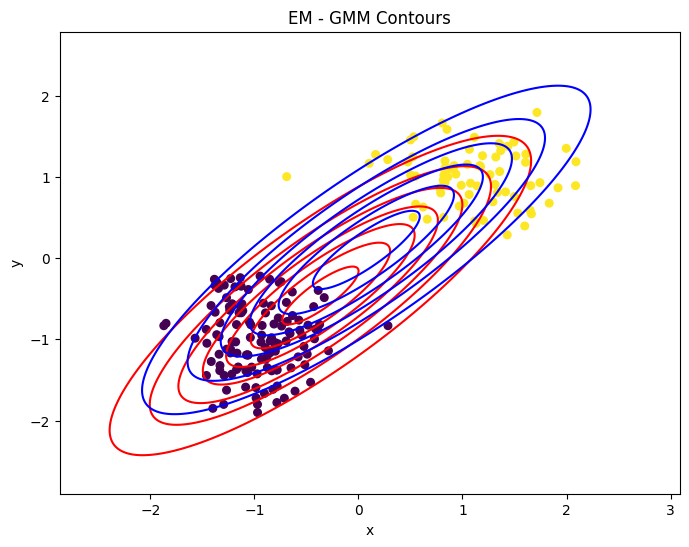

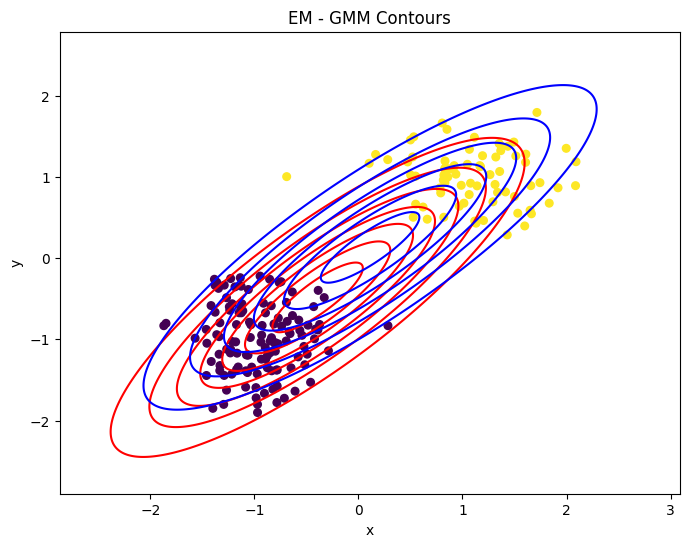

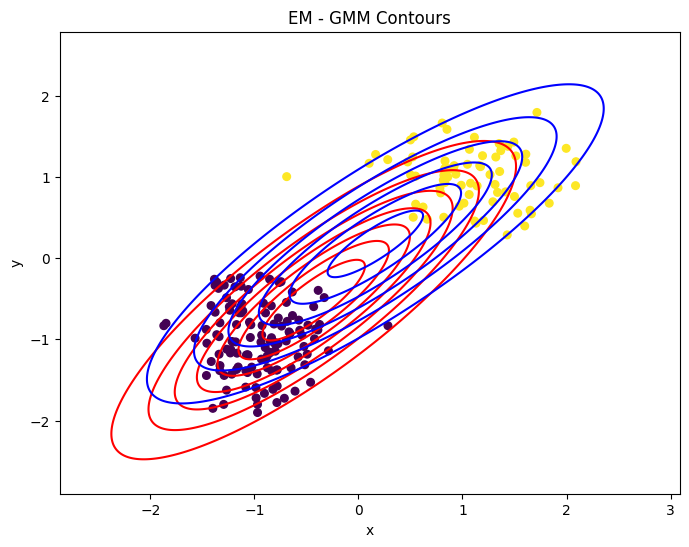

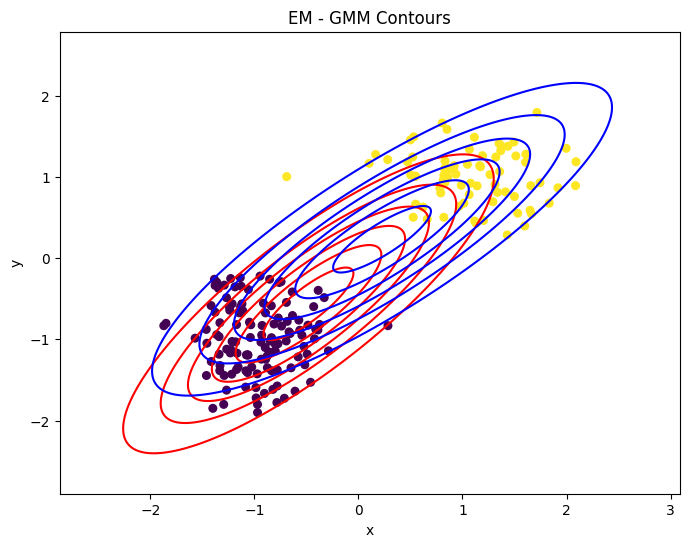

...

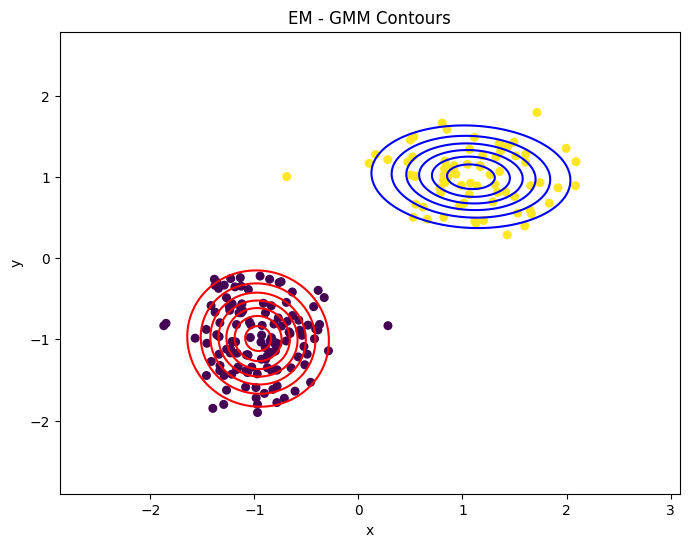

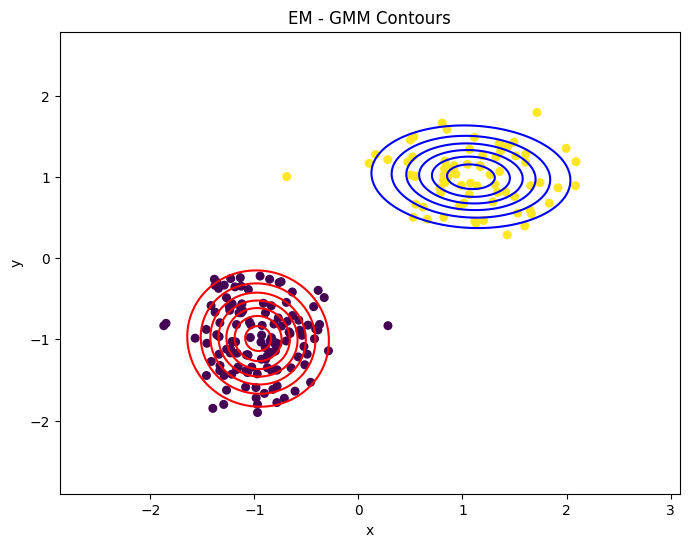

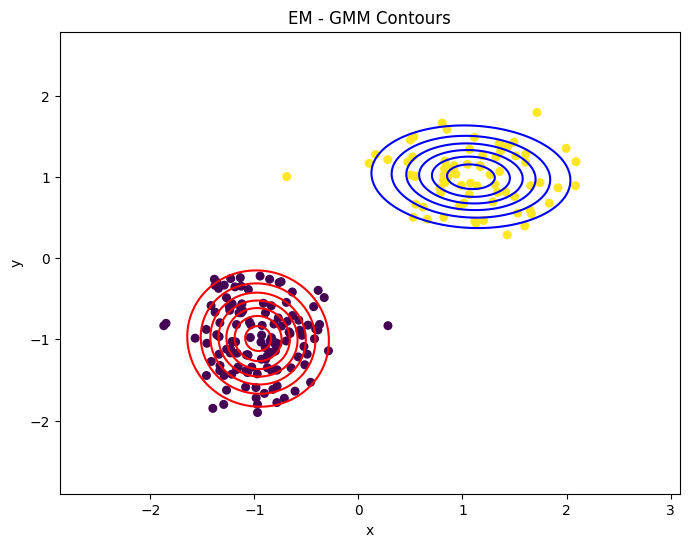

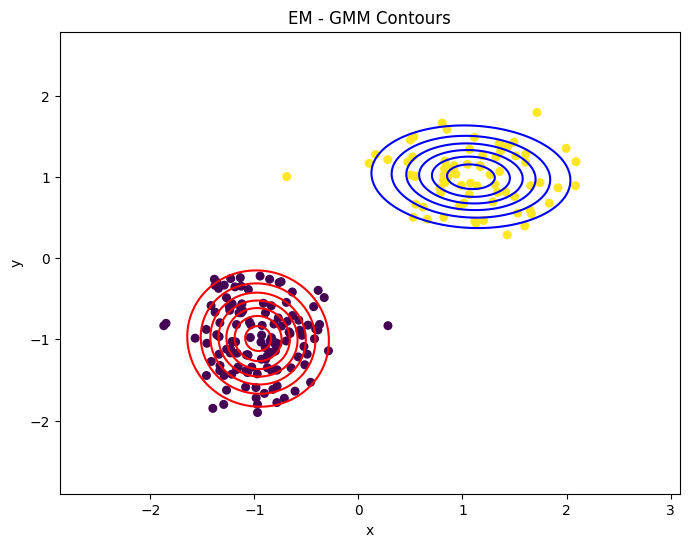

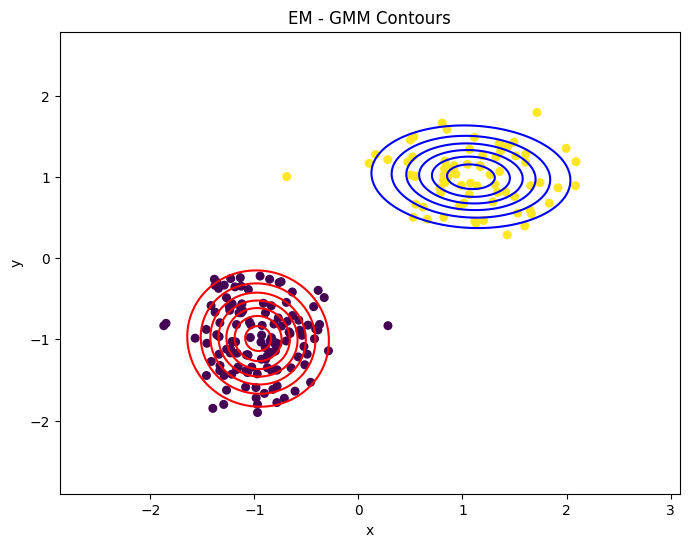

In [ ]:
############################################################################
##Part-6)-d: Understand the issues with EM algorithm
############################################################################

data = data_dg        #data to run EM-algorithm
labels = labels_dg  #labels
N, D = data.shape       #number of input examples        #data dimension
M = 2       #no.of components in GMM

pi = np.ones(M) / M      #Initialize the prior probabilities
mu = np.random.randn(M, D)      #Initialize the mean vectors
sigma = [np.eye(D) for _ in range(M)]    #Initialize the covariance matrices


nsteps = 30  #Number of steps to run EM algorithm
for index in range(0,nsteps,1):

  #Compute the likelihood
  ll = likelihood(data, pi, mu, sigma, log_likelihood=True)

  #Plot the contours
  plot_contours(data, labels, pi, mu, sigma)

  #Expectation step
  gamma = expectation(data, pi, mu, sigma)

  #Maximization step
  pi, mu, sigma = maximization(data, gamma)

<b> Report your observations </b>

1.The data points clearly formed two distinct clusters, and the EM algorithm successfully drew smooth elliptical contours around each cluster, indicating correct identification of the Gaussian components.

2.The contour shapes were roughly circular, suggesting that the EM algorithm estimated near-identity covariance matrices for both components.

3.The clustering appeared balanced, with the contours covering an equal number of points in each group, implying that the EM algorithm assigned nearly equal mixture weights to both Gaussians.

